In [1]:
#Load Packages
import os
#os.environ["THEANO_FLAGS"] = "mode=FAST_RUN,device=cuda,floatX=float32,gpuarray.preallocate=0.8"
#os.environ["KERAS_BACKEND"]="theano"
#import theano
#print(theano.config.device)
import tensorflow as tf
import csv
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.metrics import confusion_matrix
from matplotlib.pyplot import imshow
from wordcloud import WordCloud, STOPWORDS
import random as rn

# The below is necessary for starting Numpy generated random numbers
# in a well-defined initial state.

np.random.seed(1)

# The below is necessary for starting core Python generated random numbers
# in a well-defined state.

rn.seed(1)

import os
from subprocess import check_output

import urllib
import skimage.transform

from keras import layers
from keras import optimizers
from keras.layers import *
from keras.layers.embeddings import Embedding
from keras.models import Model, load_model
from keras.preprocessing import image, sequence
from keras.utils import layer_utils
from keras.utils.data_utils import get_file
from keras.applications.imagenet_utils import preprocess_input
from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
from keras.utils import plot_model
from keras.initializers import glorot_uniform
import scipy.misc
from matplotlib.pyplot import imshow
%matplotlib inline

import keras.backend as K
K.set_image_data_format('channels_last')
K.set_learning_phase(1)

import string
import re    #for regex
import nltk
from nltk.corpus import stopwords
import spacy
from nltk import pos_tag
from nltk.stem.wordnet import WordNetLemmatizer 
from nltk.tokenize import word_tokenize
# Tweet tokenizer does not split at apostophes which is what we want
from nltk.tokenize import TweetTokenizer   

Using TensorFlow backend.


In [2]:
#Combine Data & Deduplicate
df_yout = pd.read_csv("USvideos.csv")
#df_yout_gb = pd.read_csv("GBvideos.csv")
#df_yout_ca = pd.read_csv("CAvideos.csv")
#df_yout = df_yout_us.append(df_yout_gb,ignore_index=True).append(df_yout_ca,ignore_index=True)

df_yout.drop(["video_id","trending_date", "publish_time","views","likes","dislikes","comment_count","comments_disabled","ratings_disabled",\
              "video_error_or_removed","description"], axis = 1, inplace = True) 

print(df_yout.shape)
print(df_yout.nunique())

df_yout['category_name'] = np.nan

df_yout.loc[(df_yout["category_id"] == 1),"category_name"] = 'Film and Animation'
df_yout.loc[(df_yout["category_id"] == 2),"category_name"] = 'Autos & Vehicles'
df_yout.loc[(df_yout["category_id"] == 10),"category_name"] = 'Music'
df_yout.loc[(df_yout["category_id"] == 15),"category_name"] = 'Pets and Animals'
df_yout.loc[(df_yout["category_id"] == 17),"category_name"] = 'Sport'
df_yout.loc[(df_yout["category_id"] == 19),"category_name"] = 'Travel and Events'
df_yout.loc[(df_yout["category_id"] == 20),"category_name"] = 'Gaming'
df_yout.loc[(df_yout["category_id"] == 22),"category_name"] = 'People and Blogs'
df_yout.loc[(df_yout["category_id"] == 23),"category_name"] = 'Comedy'
df_yout.loc[(df_yout["category_id"] == 24),"category_name"] = 'Entertainment'
df_yout.loc[(df_yout["category_id"] == 25),"category_name"] = 'News and Politics'
df_yout.loc[(df_yout["category_id"] == 26),"category_name"] = 'How to and Style'
df_yout.loc[(df_yout["category_id"] == 27),"category_name"] = 'Education'
df_yout.loc[(df_yout["category_id"] == 28),"category_name"] = 'Science and Technology'
df_yout.loc[(df_yout["category_id"] == 29),"category_name"] = 'Non Profits and Activism'
df_yout.loc[(df_yout["category_id"] == 43),"category_name"] = 'Shows'

#Grouping
df_yout.loc[(df_yout["category_id"] == 43),"category_id"] = 24

#Reordering for one-hot-encoding
df_yout.loc[(df_yout["category_id"] == 1),"category_id"] = 0
df_yout.loc[(df_yout["category_id"] == 2),"category_id"] = 1
df_yout.loc[(df_yout["category_id"] == 10),"category_id"] = 2
df_yout.loc[(df_yout["category_id"] == 15),"category_id"] = 3
df_yout.loc[(df_yout["category_id"] == 17),"category_id"] = 4
df_yout.loc[(df_yout["category_id"] == 19),"category_id"] = 5
df_yout.loc[(df_yout["category_id"] == 20),"category_id"] = 6
df_yout.loc[(df_yout["category_id"] == 22),"category_id"] = 7
df_yout.loc[(df_yout["category_id"] == 23),"category_id"] = 8
df_yout.loc[(df_yout["category_id"] == 24),"category_id"] = 9
df_yout.loc[(df_yout["category_id"] == 25),"category_id"] = 10
df_yout.loc[(df_yout["category_id"] == 26),"category_id"] = 11
df_yout.loc[(df_yout["category_id"] == 27),"category_id"] = 12
df_yout.loc[(df_yout["category_id"] == 28),"category_id"] = 13
print()
print("After Deduplicate")

df = df_yout.drop_duplicates(subset=['thumbnail_link'], keep='first')
print(df.shape)

(40949, 5)
title             6455
channel_title     2207
category_id         16
tags              6055
thumbnail_link    6352
dtype: int64

After Deduplicate
(6352, 6)


Category Name count
Entertainment               1619
Music                        799
How to and Style             595
Comedy                       547
News and Politics            505
People and Blogs             498
Sport                        451
Science and Technology       381
Film and Animation           318
Education                    250
Pets and Animals             138
Gaming                       103
Autos & Vehicles              70
Travel and Events             60
Non Profits and Activism      14
Shows                          4
Name: category_name, dtype: int64


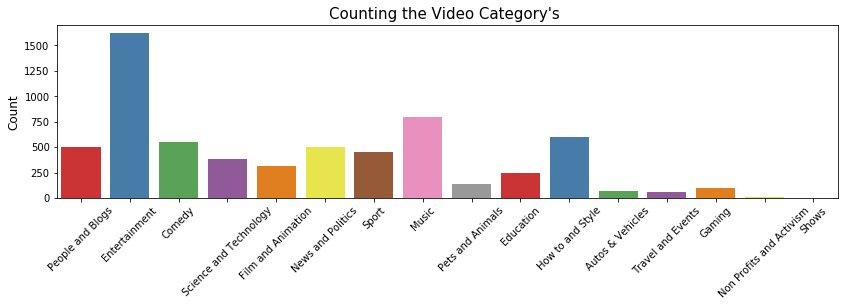

In [3]:
#EDA for Video Catergories
print("Category Name count")
print(df.category_name.value_counts())

plt.figure(figsize = (14,9))

plt.subplot(211)
g = sns.countplot('category_name', data=df, palette="Set1")
g.set_xticklabels(g.get_xticklabels(),rotation=45)
g.set_title("Counting the Video Category's ", fontsize=15)
g.set_xlabel("", fontsize=12)
g.set_ylabel("Count", fontsize=12)

plt.subplots_adjust(hspace = 0.9, top = 0.9)

plt.show()

C:\Users\woshi\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


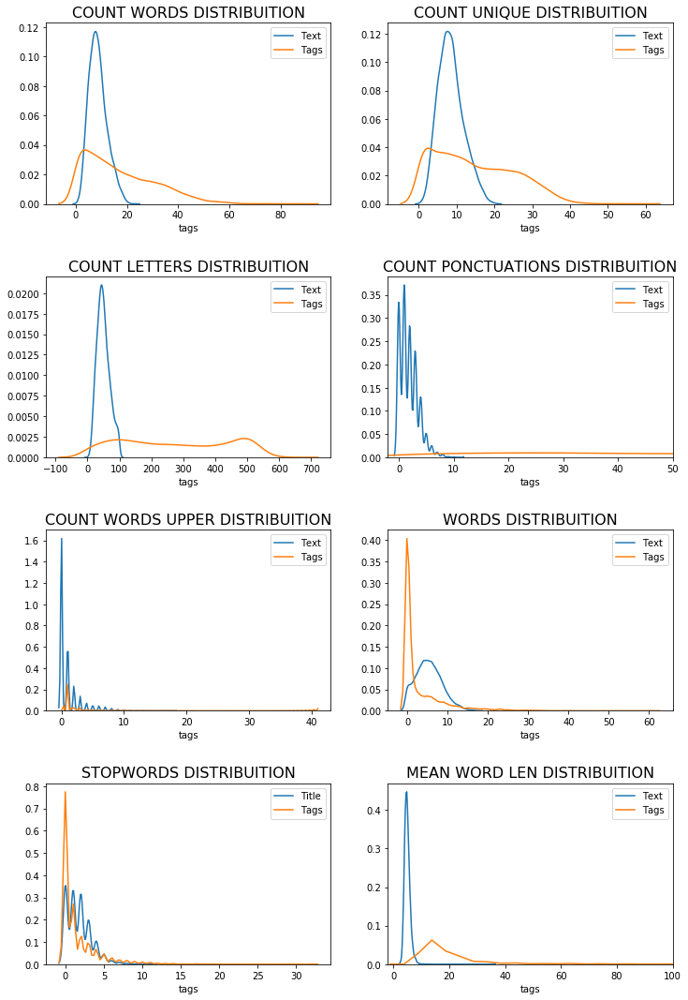

In [6]:
#EDA for titles & tags
eng_stopwords = set(stopwords.words("english"))

plt.figure(figsize = (12,18))

plt.subplot(421)
g1 = sns.distplot(df["title"].apply(lambda x: len(str(x).split())), 
                  hist=False, label='Text')
g1 = sns.distplot(df["tags"].apply(lambda x: len(str(x).split())), 
                  hist=False, label='Tags')
g1.set_title("COUNT WORDS DISTRIBUITION", fontsize=16)

plt.subplot(422)
g2 = sns.distplot(df["title"].apply(lambda x: len(set(str(x).split()))),
                  hist=False, label='Text')
g2 = sns.distplot(df["tags"].apply(lambda x: len(set(str(x).split()))), 
                  hist=False, label='Tags')
g2.set_title("COUNT UNIQUE DISTRIBUITION", fontsize=16)

plt.subplot(423)
g3 = sns.distplot(df["title"].apply(lambda x: len(str(x))), 
                  hist=False, label='Text')
g3 = sns.distplot(df["tags"].apply(lambda x: len(str(x))), 
                  hist=False, label='Tags')
g3.set_title("COUNT LETTERS DISTRIBUITION", fontsize=16)

plt.subplot(424)
g4 = sns.distplot(df["title"].apply(lambda x: len([c for c in str(x) if c in string.punctuation])), 
                  hist=False, label='Text')
g4 = sns.distplot(df["tags"].apply(lambda x: len([c for c in str(x) if c in string.punctuation])), 
                  hist=False, label='Tags')
g4.set_xlim([-2,50])
g4.set_title('COUNT PONCTUATIONS DISTRIBUITION', fontsize=16)

plt.subplot(425)
g5 = sns.distplot(df["title"].apply(lambda x: len([w for w in str(x).split() if w.isupper()])), 
                  hist=False, label='Text')
g5 = sns.distplot(df["tags"].apply(lambda x: len([w for w in str(x).split() if w.isupper()])), 
                  hist=False, label='Tags')
g5.set_title('COUNT WORDS UPPER DISTRIBUITION', fontsize=16)

plt.subplot(426)
g6 = sns.distplot(df["title"].apply(lambda x: len([w for w in str(x).split() if w.istitle()])), 
                  hist=False, label='Text')
g6 = sns.distplot(df["tags"].apply(lambda x: len([w for w in str(x).split() if w.istitle()])), 
                  hist=False, label='Tags')
g6.set_title('WORDS DISTRIBUITION', fontsize=16)

plt.subplot(427)
g7 = sns.distplot(df["title"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords])), 
                  hist=False, label='Title')
g7 = sns.distplot(df["tags"].apply(lambda x: len([w for w in str(x).lower().split() if w in eng_stopwords])), 
                  hist=False, label='Tags')
g7.set_title('STOPWORDS DISTRIBUITION', fontsize=16)

plt.subplot(428)
g8 = sns.distplot(df["title"].apply(lambda x: np.mean([len(w) for w in str(x).split()])), 
                  hist=False, label='Text')
g8 = sns.distplot(df["tags"].apply(lambda x: np.mean([len(w) for w in str(x).split()])), 
                  hist=False, label='Tags')
g8.set_xlim([-2,100])
g8.set_title('MEAN WORD LEN DISTRIBUITION', fontsize=16)

plt.subplots_adjust(wspace = 0.2, hspace = 0.4,top = 0.9)
plt.legend()
plt.show()

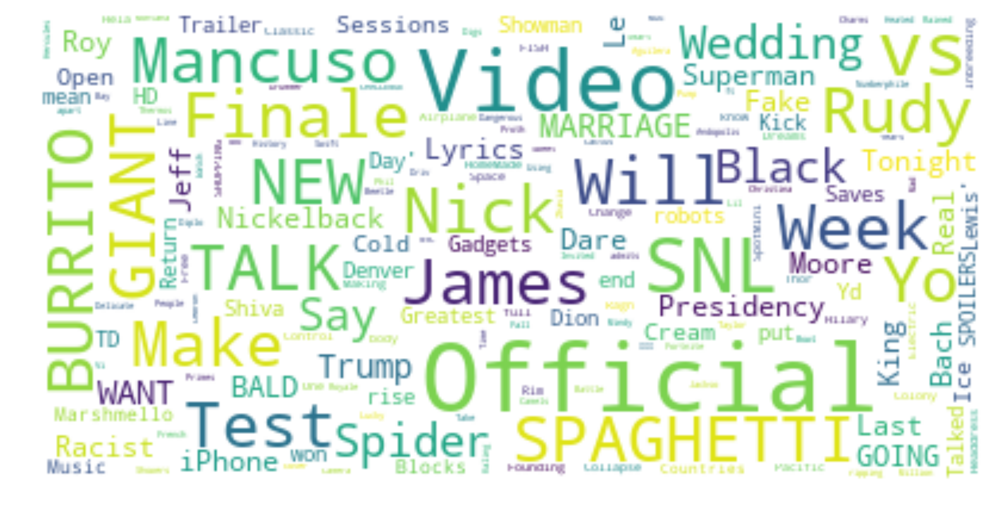

In [6]:
from wordcloud import WordCloud, ImageColorGenerator

stopwords = set(STOPWORDS)

wc = WordCloud(
                          background_color="white",
                          stopwords=stopwords,
                          max_words=1000,
                          margin = 5,
                          max_font_size=40,
                          random_state=1
                         ).generate(str(df_yout['title']))

plt.figure(figsize=(15,15), dpi=500)
plt.imshow(wc,interpolation="bilinear")
plt.axis("off")
plt.show()

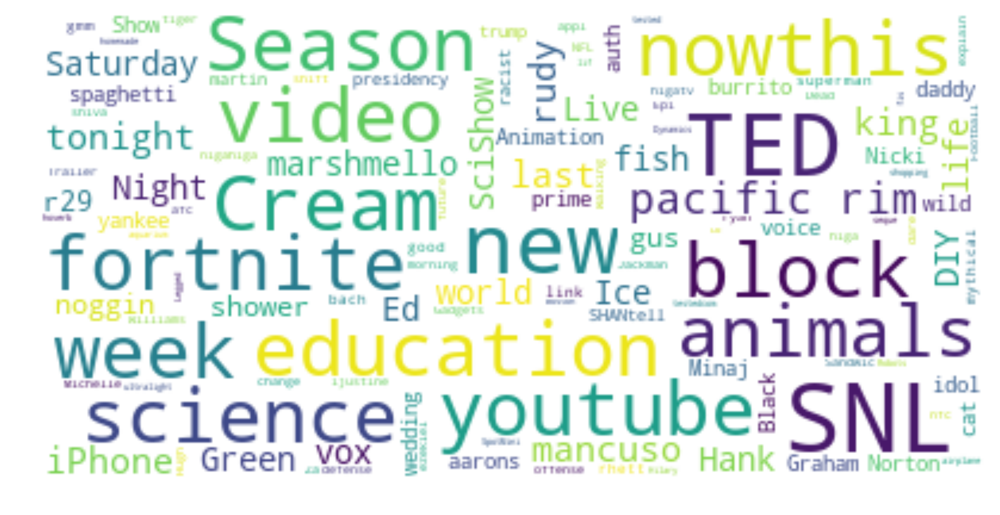

In [7]:
wc = WordCloud(
                          background_color="white",
                          stopwords=stopwords,
                          max_words=1000,
                          margin = 5,
                          max_font_size=40,
                          random_state=1
                         ).generate(str(df_yout['tags']))

plt.figure(figsize=(15,15), dpi=500)
plt.imshow(wc,interpolation="bilinear")
plt.axis("off")
plt.show()

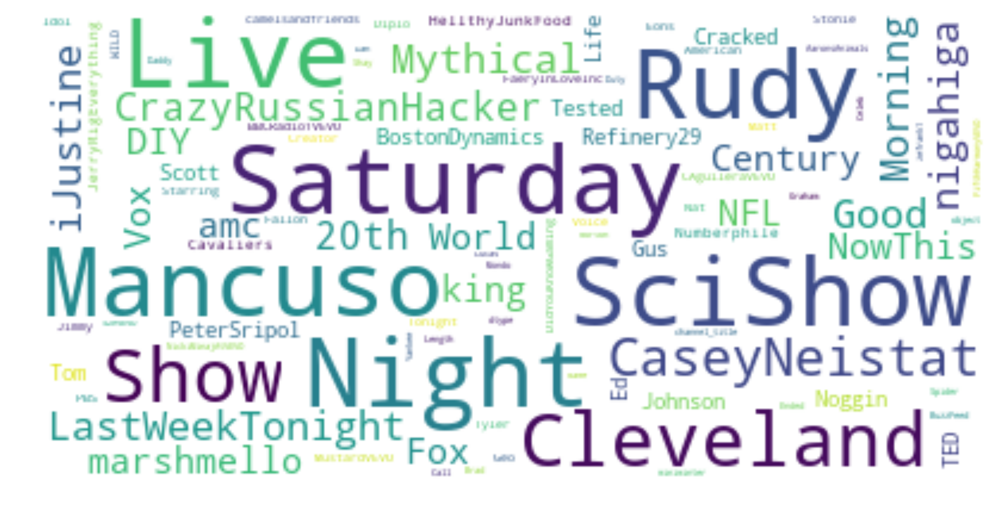

In [8]:
wc = WordCloud(
                          background_color="white",
                          stopwords=stopwords,
                          max_words=1000,
                          margin = 5,
                          max_font_size=40,
                          random_state=1
                         ).generate(str(df_yout['channel_title']))

plt.figure(figsize=(15,15), dpi=500)
plt.imshow(wc,interpolation="bilinear")
plt.axis("off")
plt.show()

In [14]:
#Download Thumbnail and turn them into array for the first time
data = []
label = []
tags = []
title = []

df_category_id = np.array(df["category_id"])
df_thumbnail_link = np.array(df["thumbnail_link"])
df_title = np.array(df["title"])
df_tags = np.array(df["tags"])

for i in range(np.array(df["thumbnail_link"]).shape[0]):
    try:
        if df_category_id[i] not in [29]:
            urllib.request.urlretrieve(df_thumbnail_link[i], "Thumbnails/" + str(i) + ".jpg")
            temp = np.array(mpimg.imread("Thumbnails/" + str(i) + ".jpg"))
            data.append(skimage.transform.resize(temp, (64, 64), mode='constant',anti_aliasing=True))
            label.append(df_category_id[i])
            title.append(df_titles[i])
            tags.append(df_tag[i])
    except:
        pass

In [3]:
#if images already have been downloaded, use the following script instead
data = []
label = []
tags = []
title = []

df_category_id = np.array(df["category_id"])
df_thumbnail_link = np.array(df["thumbnail_link"])
df_title = np.array(df["title"])
df_tags = np.array(df["tags"])

for i in range(np.array(df["thumbnail_link"]).shape[0]):
    try:
        if df_category_id[i] not in [29]:
            temp = np.array(mpimg.imread("Thumbnails/" + str(i) + ".jpg"))
            data.append(skimage.transform.resize(temp, (120, 90), mode='constant',anti_aliasing=True))
            label.append(df_category_id[i])
            title.append(df_title[i])
            tags.append(df_tags[i])
    except:
        pass

In [4]:
from keras.utils import to_categorical

#Image and text data cleaning and normalization 
data_arr = np.float32(np.array(data))
data_norm = data_arr/255
print(data_norm.shape)

label_hot = to_categorical(label)
print(type(label_hot))
print(label_hot.shape)

X_train_image = data_norm[0:5000] 
Y_train = label_hot[0:5000]

X_test_image = data_norm[5000:] 
Y_test = label_hot[5000:]

print ("X_train_image shape: " + str(X_train_image.shape))
print ("Y_train shape: " + str(Y_train.shape))
print ("X_test_image shape: " + str(X_test_image.shape))
print ("Y_test shape: " + str(Y_test.shape))

df_title = []
df_tags = []
bad_chars = [';', ':', '!', "*","'", '[',']', '(', ')',',','?','’','-','|','"'] 

for i in range(0,len(title)):
    temp = title[i]
    for j in bad_chars:
        temp = temp.replace(j,'')
    df_title.append(temp)

for i in range(0,len(tags)):
    temp = tags[i]
    for j in bad_chars:
        if j == '"':
           temp = temp.replace(j,' ') 
        else:
           temp = temp.replace(j,'')
    df_tags.append(temp)
    
# Text data
data_arr_title = np.array(df_title)
data_arr_tags = np.array(df_tags)

print(data_arr_title.shape)
print(data_arr_tags.shape)

X_train_title = data_arr_title[0:5000]
X_test_title = data_arr_title[5000:] 

X_train_tags = data_arr_tags[0:5000]
X_test_tags = data_arr_tags[5000:] 

print ("X_train_title shape: " + str(X_train_title.shape))
print ("X_test_title shape: " + str(X_test_title.shape))
print()
print ("X_train_tags shape: " + str(X_train_tags.shape))
print ("X_test_tags shape: " + str(X_test_tags.shape))

(6020, 120, 90, 3)
<class 'numpy.ndarray'>
(6020, 14)
X_train_image shape: (5000, 120, 90, 3)
Y_train shape: (5000, 14)
X_test_image shape: (1020, 120, 90, 3)
Y_test shape: (1020, 14)
(6020,)
(6020,)
X_train_title shape: (5000,)
X_test_title shape: (1020,)

X_train_tags shape: (5000,)
X_test_tags shape: (1020,)


In [18]:
from keras.applications.xception import Xception
from keras import models
from keras import optimizers

#Load the Xception model
Xception1 = Xception( weights='imagenet', include_top =False, input_shape=(120, 90, 3), pooling=None, classes=14)

# Freeze the layers except the last 1 layers
        
for layer in Xception1.layers[:-1]:
    layer.trainable = False

for layer in Xception1.layers:
    if (layer.name[-2] == "b" and layer.name[-1] == "n") or (layer.name == "batch_normalization_v1_20"):
        layer.trainable = True

Xception1.layers[-8].trainable = True
Xception1.layers[34].trainable = True
Xception1.layers[24].trainable = True
Xception1.layers[14].trainable = True

# Check the trainable status of the individual layers
for layer in Xception1.layers:
    print(layer, layer.trainable)
    
model = models.Sequential()
 
# Add the Xception base model
model.add(Xception1)
 
# Add new layers
model.add(layers.Flatten())
model.add(layers.Dense(1024, activation='relu'))
model.add(layers.Dropout(0.55))
model.add(layers.Dense(512, activation='relu'))
model.add(layers.Dropout(0.55))
model.add(layers.Dense(128, activation='relu'))
model.add(layers.Dropout(0.55))

model.add(layers.Dense(14, activation='softmax'))
 
# Show a summary of the model. Check the number of trainable parameters
model.summary()

<keras.engine.input_layer.InputLayer object at 0x0000026320340FD0> False
<keras.layers.convolutional.Conv2D object at 0x0000026320340588> False
<keras.layers.normalization.BatchNormalization object at 0x000002632037E080> True
<keras.layers.core.Activation object at 0x000002632037E550> False
<keras.layers.convolutional.Conv2D object at 0x000002632037E358> False
<keras.layers.normalization.BatchNormalization object at 0x0000026320395BA8> True
<keras.layers.core.Activation object at 0x000002632037ED30> False
<keras.layers.convolutional.SeparableConv2D object at 0x0000026320492EB8> False
<keras.layers.normalization.BatchNormalization object at 0x0000026321F25748> True
<keras.layers.core.Activation object at 0x000002632671EE48> False
<keras.layers.convolutional.SeparableConv2D object at 0x000002632669CA20> False
<keras.layers.normalization.BatchNormalization object at 0x0000026327C23668> True
<keras.layers.convolutional.Conv2D object at 0x00000263203FA438> False
<keras.layers.pooling.MaxPoo

In [19]:
from keras import metrics 

adam = optimizers.Adam(lr=0.001, beta_1=0.9, beta_2=0.999, decay=0.03, amsgrad=False)
model.compile(loss='categorical_crossentropy',
              optimizer=adam,
              metrics=[metrics.categorical_accuracy,metrics.top_k_categorical_accuracy])

In [20]:
history = model.fit(X_train_image, Y_train, epochs = 30, batch_size = 64,shuffle=False,verbose=1)
preds = model.evaluate(X_test_image, Y_test)

print()
print ("Loss = " + str(preds[0]))
print ("Test Accuracy = " + str(preds[1]))

Epoch 1/30
5000/5000 [==============================] - 23s 5ms/step - loss: 3.1536 - categorical_accuracy: 0.1490 - top_k_categorical_accuracy: 0.5140
Epoch 2/30
5000/5000 [==============================] - 14s 3ms/step - loss: 2.5689 - categorical_accuracy: 0.2044 - top_k_categorical_accuracy: 0.5944
Epoch 3/30
5000/5000 [==============================] - 14s 3ms/step - loss: 2.5178 - categorical_accuracy: 0.2222 - top_k_categorical_accuracy: 0.6150
Epoch 4/30
5000/5000 [==============================] - 14s 3ms/step - loss: 2.4689 - categorical_accuracy: 0.2270 - top_k_categorical_accuracy: 0.6198
Epoch 5/30
5000/5000 [==============================] - 14s 3ms/step - loss: 2.4169 - categorical_accuracy: 0.2326 - top_k_categorical_accuracy: 0.6418
Epoch 6/30
5000/5000 [==============================] - 14s 3ms/step - loss: 2.3865 - categorical_accuracy: 0.2342 - top_k_categorical_accuracy: 0.6436
Epoch 7/30
5000/5000 [==============================] - 14s 3ms/step - loss: 2.3595 - ca

[[  0   0   7   0   0   0   0   0   4  36   0   6   0   0]
 [  0   0   0   0   0   0   0   0   1   1   0   0   0   0]
 [  0   0  51   0   2   0   0   0   2  74   0   9   0   0]
 [  0   0   1   0   0   0   0   0   0  12   1   2   0   0]
 [  0   0   8   0   1   0   0   1   3  52   2   5   1   0]
 [  0   0   0   0   0   0   0   0   0   4   0   1   0   0]
 [  0   0   4   0   1   0   0   2   1  24   0   4   2   0]
 [  0   0   5   0   1   0   0   0   1  53   1  13   0   2]
 [  0   0  11   0   1   0   0   0   8  57   2   8   0   2]
 [  0   0  39   0   2   0   0   4  15 214   2  24   0   2]
 [  0   0   6   0   0   0   0   1   1  36   1   2   0   0]
 [  0   0   4   0   1   0   0   2   3  68   1  15   1   3]
 [  0   0   4   0   1   0   0   0   1  19   0   7   0   2]
 [  0   0   4   0   1   0   0   1   0  35   0   6   0   2]]


C:\Users\woshi\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


0.2078809006742265


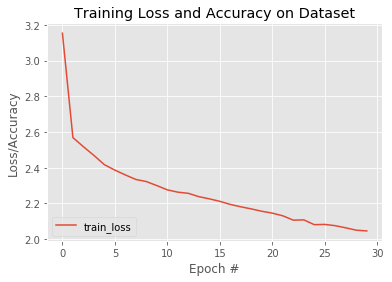

In [23]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 30), history.history["loss"], label="train_loss")

plt.title("Training Loss and Accuracy on Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot.png")

from sklearn.metrics import confusion_matrix   
print(confusion_matrix(Y_test.argmax(axis=1), model.predict(X_test_image).argmax(axis=1)))
print(f1_score(Y_test.argmax(axis=1), model.predict(X_test_image).argmax(axis=1),average = 'weighted'))

In [5]:
#NLP Models from here onwards -----------
def read_glove_vecs(glove_file):
    with open(glove_file, 'r',encoding="utf8") as f:
        words = set()
        word_to_vec_map = {}
        for line in f:
            line = line.strip().split()
            curr_word = line[0]
            words.add(curr_word)
            word_to_vec_map[curr_word] = np.array(line[1:], dtype=np.float64)
        
        i = 1
        words_to_index = {}
        index_to_words = {}
        for w in sorted(words):
            words_to_index[w] = i
            index_to_words[i] = w
            i = i + 1
    return words_to_index, index_to_words, word_to_vec_map

word_to_index, index_to_word, word_to_vec_map = read_glove_vecs('glove.twitter.27B.50d.txt')

In [6]:
#Count max number of words in a video title
max_len = 0 
for i in range(0,len(df_title)): 
    if len(np.array(df_title)[i].split())>max_len:
        max_len = len(np.array(df_title)[i].split()) 
print(max_len)

20


99

In [7]:
# GRADED FUNCTION: sentences_to_indices

def sentences_to_indices(X, word_to_index, max_len):
    """
    Converts an array of sentences (strings) into an array of indices corresponding to words in the sentences.
    The output shape should be such that it can be given to `Embedding()` (described in Figure 4). 
    
    Arguments:
    X -- array of sentences (strings), of shape (m, 1)
    word_to_index -- a dictionary containing the each word mapped to its index
    max_len -- maximum number of words in a sentence. You can assume every sentence in X is no longer than this. 
    
    Returns:
    X_indices -- array of indices corresponding to words in the sentences from X, of shape (m, max_len)
    """
    
    m = X.shape[0]                                   # number of training examples
    
    ### START CODE HERE ###
    # Initialize X_indices as a numpy matrix of zeros and the correct shape (≈ 1 line)
    X_indices = np.zeros((m,max_len))
    
    for i in range(m):                               # loop over training examples
        # Convert the ith training sentence in lower case and split is into words. You should get a list of words.
        sentence_words = X[i].lower().split()
        
        # Initialize j to 0
        j = 0
        
        # Loop over the words of sentence_words
        for w in sentence_words:
            # Set the (i,j)th entry of X_indices to the index of the correct word.
            try:
                X_indices[i, j] = word_to_index[w]
                # Increment j to j + 1
                j = j + 1
            except:
                pass

            
    ### END CODE HERE ###
    
    return X_indices

In [8]:
# GRADED FUNCTION: pretrained_embedding_layer

def pretrained_embedding_layer(word_to_vec_map, word_to_index):
    """
    Creates a Keras Embedding() layer and loads in pre-trained GloVe 50-dimensional vectors.
    
    Arguments:
    word_to_vec_map -- dictionary mapping words to their GloVe vector representation.
    word_to_index -- dictionary mapping from words to their indices in the vocabulary (400,001 words)

    Returns:
    embedding_layer -- pretrained layer Keras instance
    """
    
    vocab_len = len(word_to_index) + 1                  # adding 1 to fit Keras embedding (requirement)
    emb_dim = word_to_vec_map["cucumber"].shape[0]      # define dimensionality of your GloVe word vectors (= 50)
    
    ### START CODE HERE ###
    # Initialize the embedding matrix as a numpy array of zeros of shape (vocab_len, dimensions of word vectors = emb_dim)
    emb_matrix = np.zeros((vocab_len,emb_dim))
    
    # Set each row "index" of the embedding matrix to be the word vector representation of the "index"th word of the vocabulary
    for word, index in word_to_index.items():
        try:
            emb_matrix[index, :] = word_to_vec_map[word]
        except:
            pass
    # Define Keras embedding layer with the correct output/input sizes, make it trainable. Use Embedding(...). Make sure to set trainable=False. 
    embedding_layer = Embedding(vocab_len,emb_dim,trainable = False)
    ### END CODE HERE ###

    # Build the embedding layer, it is required before setting the weights of the embedding layer. Do not modify the "None".
    embedding_layer.build((None,))
    
    # Set the weights of the embedding layer to the embedding matrix. Your layer is now pretrained.
    embedding_layer.set_weights([emb_matrix])
    
    return embedding_layer

In [9]:
embedding_layer = pretrained_embedding_layer(word_to_vec_map, word_to_index)

Instructions for updating:
Colocations handled automatically by placer.


In [10]:
def nlp_model(input_shape, word_to_vec_map, word_to_index,classes = 14):
    """
    Function creating the Emojify-v2 model's graph.
    
    Arguments:
    input_shape -- shape of the input, usually (max_len,)
    word_to_vec_map -- dictionary mapping every word in a vocabulary into its 50-dimensional vector representation
    word_to_index -- dictionary mapping from words to their indices in the vocabulary (400,001 words)

    Returns:
    model -- a model instance in Keras
    """
    
    # Define sentence_indices as the input of the graph, it should be of shape input_shape and dtype 'int32' (as it contains indices).
    sentence_indices = Input(input_shape, dtype='int32')
    
    # Create the embedding layer pretrained with GloVe Vectors (≈1 line)
    embedding_layer = pretrained_embedding_layer(word_to_vec_map, word_to_index)
    
    # Propagate sentence_indices through your embedding layer, you get back the embeddings
    embeddings = embedding_layer(sentence_indices)    
    
    # Propagate the embeddings through an LSTM layer with 128-dimensional hidden state
    # Be careful, the returned output should be a batch of sequences.
    X = LSTM(128, return_sequences=True)(embeddings)
    # Add dropout with a probability of 0.5
    X = Dropout(0.85)(X)
    # Propagate X trough another LSTM layer with 128-dimensional hidden state
    # Be careful, the returned output should be a single hidden state, not a batch of sequences.
    X = LSTM(128, return_sequences=False)(X)
    # Add dropout with a probability of 0.5
    X = Dropout(0.85)(X)
    # Propagate X through a Dense layer with softmax activation to get back a batch of 5-dimensional vectors.
    X = Dense(classes)(X)
    # Add a softmax activation
    X = Activation('softmax')(X)
    
    # Create Model instance which converts sentence_indices into X.
    model = Model(inputs=sentence_indices, outputs=X)
    
    return model

In [12]:
from keras import metrics
model_title = nlp_model((max_len,), word_to_vec_map, word_to_index)
model_title.summary()
model_title.compile(loss='categorical_crossentropy', optimizer='adam', metrics=[metrics.categorical_accuracy,metrics.top_k_categorical_accuracy])

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 20)                0         
_________________________________________________________________
embedding_3 (Embedding)      (None, 20, 50)            59675750  
_________________________________________________________________
lstm_3 (LSTM)                (None, 20, 128)           91648     
_________________________________________________________________
dropout_3 (Dropout)          (None, 20, 128)           0         
_________________________________________________________________
lstm_4 (LSTM)                (None, 128)               131584    
_________________________________________________________________
dropout_4 (Dropout)          (None, 128)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 14)                1806      
__________

In [13]:
X_train_indices_title = sentences_to_indices(X_train_title, word_to_index, max_len)
X_test_indices_title = sentences_to_indices(X_test_title, word_to_index, max_len)
X_train_indices_tags = sentences_to_indices(X_train_tags, word_to_index, max_len_tags)
X_test_indices_tags = sentences_to_indices(X_test_tags, word_to_index, max_len_tags)

In [14]:
history2 = model_title.fit(X_train_indices_title, Y_train, epochs = 30, batch_size = 64, shuffle=False)

Instructions for updating:
Use tf.cast instead.
Epoch 1/30
5000/5000 [==============================] - 7s 1ms/step - loss: 2.3347 - categorical_accuracy: 0.2546 - top_k_categorical_accuracy: 0.6440
Epoch 2/30
5000/5000 [==============================] - 5s 1ms/step - loss: 2.0037 - categorical_accuracy: 0.3698 - top_k_categorical_accuracy: 0.7408
Epoch 3/30
5000/5000 [==============================] - 5s 1ms/step - loss: 1.8708 - categorical_accuracy: 0.4180 - top_k_categorical_accuracy: 0.7946
Epoch 4/30
5000/5000 [==============================] - 5s 1ms/step - loss: 1.8076 - categorical_accuracy: 0.4368 - top_k_categorical_accuracy: 0.8124
Epoch 5/30
5000/5000 [==============================] - 5s 1ms/step - loss: 1.7381 - categorical_accuracy: 0.4504 - top_k_categorical_accuracy: 0.8296
Epoch 6/30
5000/5000 [==============================] - 5s 1ms/step - loss: 1.7024 - categorical_accuracy: 0.4630 - top_k_categorical_accuracy: 0.8368
Epoch 7/30
5000/5000 [========================

In [15]:
loss, acc, top_5_acc = model_title.evaluate(X_test_indices_title, Y_test)
print("Top-1 accuracy = " + str(acc))
print("Top-5 accuracy = " + str(top_5_acc))

1020/1020 [==============================] - 1s 1ms/step
Top-1 accuracy = 0.486274509453306
Top-5 accuracy = 0.8362745105051527


[[ 30   0   3   1   0   0   0   1   9   3   2   2   0   2]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   2]
 [  3   0  84   0   0   0   0   5   9  28   0   1   2   6]
 [  1   0   0   6   0   0   0   0   1   1   0   3   0   4]
 [  2   0   0   1  63   2   0   1   0   1   2   0   1   0]
 [  0   0   0   0   0   1   0   1   0   1   0   1   0   1]
 [ 10   0   0   1   1   0   9   0   2   9   1   1   1   3]
 [  0   1   4   3   2   0   0   9  11  15   1  19   3   8]
 [  2   0   5   1   3   0   0   8  19  28   0   5   6  12]
 [ 15   0   6   1  11   0   0  21  21 173   4  30   5  15]
 [  0   0   1   0   1   0   0   4   2   6  24   2   4   3]
 [  1   0   1   0   1   0   0  10   3  24   0  49   2   7]
 [  0   0   0   0   0   0   0   5   4   1   0   2   8  14]
 [  0   0   0   2   0   0   1   2   1   4   0   4   2  33]]
0.49055378263001115


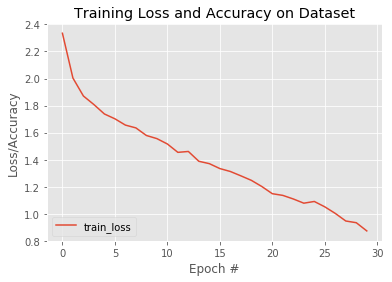

In [17]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 30), history2.history["loss"], label="train_loss")

plt.title("Training Loss and Accuracy on Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot.png")
from sklearn.metrics import f1_score
print(confusion_matrix(Y_test.argmax(axis=1), model_title.predict(X_test_indices_title).argmax(axis=1)))
print(f1_score(Y_test.argmax(axis=1), model_title.predict(X_test_indices_title).argmax(axis=1),average = 'weighted'))

In [25]:
mergedOut = Add()([model.output,model_title.output])
mergedOut = Dense(256, activation='relu')(mergedOut)
mergedOut = Dropout(.35)(mergedOut)
mergedOut = Dense(128, activation='relu')(mergedOut)
mergedOut = Dropout(.35)(mergedOut)

# output layer
mergedOut = Dense(14, activation='softmax')(mergedOut)

model_final = Model([model.input,model_title.input], mergedOut)
model_final.compile(loss='categorical_crossentropy', optimizer='adam', metrics=[metrics.categorical_accuracy,metrics.top_k_categorical_accuracy])
model_final.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
xception_input (InputLayer)     (None, 120, 90, 3)   0                                            
__________________________________________________________________________________________________
xception (Model)                (None, 4, 3, 2048)   20861480    xception_input[0][0]             
__________________________________________________________________________________________________
flatten_1 (Flatten)             (None, 24576)        0           xception[1][0]                   
__________________________________________________________________________________________________
input_2 (InputLayer)            (None, 20)           0                                            
__________________________________________________________________________________________________
dense_1 (D

In [26]:
history3 = model_final.fit([X_train_image, X_train_indices_title], Y_train,epochs = 30, batch_size = 64, shuffle=False)    

Epoch 1/30
5000/5000 [==============================] - 25s 5ms/step - loss: 1.8878 - categorical_accuracy: 0.4222 - top_k_categorical_accuracy: 0.7830
Epoch 2/30
5000/5000 [==============================] - 18s 4ms/step - loss: 1.4390 - categorical_accuracy: 0.5664 - top_k_categorical_accuracy: 0.8734
Epoch 3/30
5000/5000 [==============================] - 18s 4ms/step - loss: 1.3550 - categorical_accuracy: 0.5902 - top_k_categorical_accuracy: 0.8806
Epoch 4/30
5000/5000 [==============================] - 18s 4ms/step - loss: 1.3175 - categorical_accuracy: 0.6040 - top_k_categorical_accuracy: 0.8870
Epoch 5/30
5000/5000 [==============================] - 18s 4ms/step - loss: 1.3021 - categorical_accuracy: 0.6012 - top_k_categorical_accuracy: 0.8920
Epoch 6/30
5000/5000 [==============================] - 18s 4ms/step - loss: 1.2763 - categorical_accuracy: 0.6106 - top_k_categorical_accuracy: 0.8964
Epoch 7/30
5000/5000 [==============================] - 18s 4ms/step - loss: 1.2834 - ca

In [27]:
loss, acc, top_5_acc = model_final.evaluate([X_test_image,X_test_indices_title], Y_test)
print("Top-1 accuracy = " + str(acc))
print("Top-5 accuracy = " + str(top_5_acc))

1020/1020 [==============================] - 3s 3ms/step
Top-1 accuracy = 0.4529411768212038
Top-5 accuracy = 0.842156862745098


[[  0   0   4   2   0   0   0   3   9  32   1   0   0   2]
 [  0   0   0   0   0   0   0   0   0   0   0   0   0   2]
 [  1   0 100   0   0   0   0   1  13  16   2   0   0   5]
 [  0   0   0   0   0   0   0   1   0   0   0   0   0  15]
 [  0   0   0   0  56   0   0   2   3   3   4   0   0   5]
 [  0   0   0   0   0   0   0   4   0   0   0   0   0   1]
 [  0   0   1   1   2   0   1   2   6  13   1   0   0  11]
 [  0   0   4   0   2   0   0  13  14  10   2  18   0  13]
 [  0   0   3   0   2   0   0  17  29  21   2   6   0   9]
 [  0   0  16   0   7   0   0  20  51 145   3  20   0  40]
 [  0   0   3   0   0   0   0   3   5   9  21   0   0   6]
 [  0   0   1   0   0   0   0  19   6   8   0  47   0  17]
 [  0   0   1   0   0   0   0   3   2   3   0   4   0  21]
 [  0   0   0   0   0   0   0   5   3   3   0   2   0  36]]


C:\Users\woshi\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


0.4327853858377169


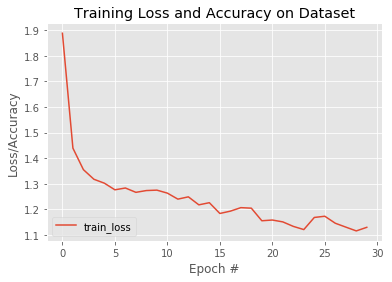

In [28]:
plt.style.use("ggplot")
plt.figure()
plt.plot(np.arange(0, 30), history3.history["loss"], label="train_loss")

plt.title("Training Loss and Accuracy on Dataset")
plt.xlabel("Epoch #")
plt.ylabel("Loss/Accuracy")
plt.legend(loc="lower left")
plt.savefig("plot.png")

from sklearn.metrics import f1_score
print(confusion_matrix(Y_test.argmax(axis=1), model_final.predict([X_test_image,X_test_indices_title]).argmax(axis=1)))
print(f1_score(Y_test.argmax(axis=1), model_final.predict([X_test_image,X_test_indices_title]).argmax(axis=1),average = 'weighted'))